In [2]:
from keras.models import Model, load_model
from keras.layers import Conv2D, Dense, Dropout, Activation, Flatten, Input, Subtract, LeakyReLU
from keras.layers.pooling import MaxPooling2D
from keras.layers.normalization import BatchNormalization
from keras import backend as K
from matplotlib import pyplot as plt
import numpy as np
from keras.callbacks import EarlyStopping


C:\Users\IDIP\Anaconda3\envs\tf_gpu\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [6]:
import cv2
import numpy as np
import os
f_list = sorted(os.listdir("./hha"))
img_depth_list = []
img_color_list = []
label_list = []
for f in f_list:
    img_depth = cv2.imread(os.path.join("./hha", f))
    img_depth_list.append(img_depth)
    img_color = cv2.imread(os.path.join("./images", f))
    img_color_list.append(img_color)
    label_list.append(np.zeros((1,1,512)))
    
depth_train = np.array(img_depth_list)
color_train = np.array(img_color_list)
label_train = np.array(label_list)

(1449, 425, 560, 3)
(1449, 425, 560, 3)
(1449, 1, 1, 256)


In [3]:
# concate 2 model 
rgb_input = Input(shape=(None, None, 3))
conv1_1 = Conv2D(64, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='conv1_1', trainable=False)(rgb_input)
conv1_2 = Conv2D(64, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='conv1_2', trainable=False)(conv1_1)
maxpooling1 = MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid', name='pool1', trainable=False)(conv1_2)
conv2_1 = Conv2D(128, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='conv2_1', trainable=False)(maxpooling1)
conv2_2 = Conv2D(128, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='conv2_2', trainable=False)(conv2_1)
maxpooling2 = MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid', name='pool2', trainable=False)(conv2_2)
conv3_1 = Conv2D(256, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='conv3_1', trainable=False)(maxpooling2)
conv3_2 = Conv2D(256, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='conv3_2', trainable=False)(conv3_1)
conv3_3 = Conv2D(256, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='conv3_3', trainable=False)(conv3_2)
maxpooling3 = MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid', name='pool3', trainable=False)(conv3_3)

conv4_1 = Conv2D(512, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='conv4_1', trainable=False)(maxpooling3)
conv4_2 = Conv2D(512, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='conv4_2', trainable=False)(conv4_1)
conv4_3 = Conv2D(512, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='conv4_3', trainable=False)(conv4_2)
maxpooling4 = MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid', name='pool4', trainable=False)(conv4_3)

conv5_1 = Conv2D(512, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='conv5_1', trainable=False)(maxpooling4)
conv5_2 = Conv2D(512, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='conv5_2', trainable=False)(conv5_1)
conv5_3 = Conv2D(512, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='conv5_3', trainable=False)(conv5_2)
maxpooling5 = MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid', name='pool5', trainable=False)(conv5_3)

d_input = Input(shape=(None, None, 3))
d_conv1_1 = Conv2D(64, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='d_conv1_1')(d_input)
d_conv1_2 = Conv2D(64, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='d_conv1_2')(d_conv1_1)
d_maxpooling1 = MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid', name='d_pool1', trainable=False)(d_conv1_2)
d_conv2_1 = Conv2D(128, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='d_conv2_1')(d_maxpooling1)
d_conv2_2 = Conv2D(128, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='d_conv2_2')(d_conv2_1)
d_maxpooling2 = MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid', name='d_pool2')(d_conv2_2)
d_conv3_1 = Conv2D(256, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='d_conv3_1')(d_maxpooling2)
d_conv3_2 = Conv2D(256, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='d_conv3_2')(d_conv3_1)
d_conv3_3 = Conv2D(256, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='d_conv3_3')(d_conv3_2)
d_maxpooling3 = MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid', name='d_pool3')(d_conv3_3)

d_conv4_1 = Conv2D(512, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='d_conv4_1')(d_maxpooling3)
d_conv4_2 = Conv2D(512, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='d_conv4_2')(d_conv4_1)
d_conv4_3 = Conv2D(512, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='d_conv4_3')(d_conv4_2)
d_maxpooling4 = MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid', name='d_pool4')(d_conv4_3)

d_conv5_1 = Conv2D(512, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='d_conv5_1')(d_maxpooling4)
d_conv5_2 = Conv2D(512, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='d_conv5_2')(d_conv5_1)
d_conv5_3 = Conv2D(512, kernel_size=3, padding='same', activation='relu', strides=(1,1), name='d_conv5_3')(d_conv5_2)
d_maxpooling5 = MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid', name='d_pool5')(d_conv5_3)

subtracted = Subtract()([conv5_3, d_conv5_3])


cross_modal = Model([rgb_input, d_input], subtracted)
cross_modal.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv1_1 (Conv2D)                (None, None, None, 6 1792        input_1[0][0]                    
__________________________________________________________________________________________________
d_conv1_1 (Conv2D)              (None, None, None, 6 1792        input_2[0][0]                    
__________________________________________________________________________________________________
conv1_2 (C

In [4]:
cross_modal.load_weights("Model/VGG16/vgg16_weights.h5", by_name=True)
opt = Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
cross_modal.compile(loss='mse', optimizer=opt, metrics=['mae'])

In [7]:
early_stopping = EarlyStopping(monitor='val_loss',
                               min_delta=0, 
                               patience=10, 
                               verbose=0, 
                               mode='auto')

start = time.time()
train_history = cross_modal.fit([color_train, depth_train], label_train, batch_size=32,
                          validation_split=0.1, epochs=5000, verbose=1, callbacks = [early_stopping])
print("Training Time : ", time.time() - start)
cross_modal.save_weights('rgbd_vgg16.h5')

Train on 1304 samples, validate on 145 samples
Epoch 1/5000
1304/1304 [==============================] - 21s 16ms/step - loss: 1.5604 - mean_absolute_error: 0.9476 - val_loss: 11.7735 - val_mean_absolute_error: 2.6781
Epoch 2/5000
1304/1304 [==============================] - 15s 12ms/step - loss: 1.2861 - mean_absolute_error: 0.8755 - val_loss: 1.8936 - val_mean_absolute_error: 1.0089
Epoch 3/5000
1304/1304 [==============================] - 15s 12ms/step - loss: 1.1218 - mean_absolute_error: 0.8213 - val_loss: 1.3265 - val_mean_absolute_error: 0.8786
Epoch 4/5000
1304/1304 [==============================] - 15s 12ms/step - loss: 1.0114 - mean_absolute_error: 0.7789 - val_loss: 1.3513 - val_mean_absolute_error: 0.8873
Epoch 5/5000
1304/1304 [==============================] - 15s 12ms/step - loss: 0.8920 - mean_absolute_error: 0.7315 - val_loss: 1.1647 - val_mean_absolute_error: 0.8229
Epoch 6/5000
1304/1304 [==============================] - 15s 12ms/step - loss: 0.7984 - mean_absolute

Epoch 49/5000
1304/1304 [==============================] - 15s 12ms/step - loss: 0.0053 - mean_absolute_error: 0.0505 - val_loss: 0.0123 - val_mean_absolute_error: 0.0783
Epoch 50/5000
1304/1304 [==============================] - 15s 12ms/step - loss: 0.0048 - mean_absolute_error: 0.0481 - val_loss: 0.0113 - val_mean_absolute_error: 0.0743
Epoch 51/5000
1304/1304 [==============================] - 15s 12ms/step - loss: 0.0043 - mean_absolute_error: 0.0453 - val_loss: 0.0105 - val_mean_absolute_error: 0.0714
Epoch 52/5000
1304/1304 [==============================] - 15s 12ms/step - loss: 0.0039 - mean_absolute_error: 0.0432 - val_loss: 0.0095 - val_mean_absolute_error: 0.0678
Epoch 53/5000
1304/1304 [==============================] - 15s 12ms/step - loss: 0.0035 - mean_absolute_error: 0.0408 - val_loss: 0.0089 - val_mean_absolute_error: 0.0654
Epoch 54/5000
1304/1304 [==============================] - 15s 12ms/step - loss: 0.0031 - mean_absolute_error: 0.0384 - val_loss: 0.0081 - val_me

Epoch 96/5000
1304/1304 [==============================] - 15s 12ms/step - loss: 3.6571e-05 - mean_absolute_error: 0.0032 - val_loss: 1.6363e-04 - val_mean_absolute_error: 0.0065
Epoch 97/5000
1304/1304 [==============================] - 15s 12ms/step - loss: 3.2589e-05 - mean_absolute_error: 0.0030 - val_loss: 1.4602e-04 - val_mean_absolute_error: 0.0061
Epoch 98/5000
1304/1304 [==============================] - 15s 12ms/step - loss: 2.8634e-05 - mean_absolute_error: 0.0028 - val_loss: 1.2945e-04 - val_mean_absolute_error: 0.0057
Epoch 99/5000
1304/1304 [==============================] - 15s 12ms/step - loss: 2.5191e-05 - mean_absolute_error: 0.0026 - val_loss: 1.1488e-04 - val_mean_absolute_error: 0.0053
Epoch 100/5000
1304/1304 [==============================] - 15s 12ms/step - loss: 2.2304e-05 - mean_absolute_error: 0.0024 - val_loss: 1.0238e-04 - val_mean_absolute_error: 0.0049
Epoch 101/5000
1304/1304 [==============================] - 15s 12ms/step - loss: 1.9562e-05 - mean_abso

Epoch 184/5000
1304/1304 [==============================] - 15s 12ms/step - loss: 1.7749e-09 - mean_absolute_error: 1.1735e-05 - val_loss: 1.5362e-09 - val_mean_absolute_error: 1.0232e-05
Epoch 185/5000
1304/1304 [==============================] - 15s 12ms/step - loss: 1.6908e-09 - mean_absolute_error: 1.0529e-05 - val_loss: 1.5666e-09 - val_mean_absolute_error: 1.0303e-05
Epoch 186/5000
1304/1304 [==============================] - 15s 12ms/step - loss: 1.8340e-09 - mean_absolute_error: 1.1334e-05 - val_loss: 1.7014e-09 - val_mean_absolute_error: 1.1390e-05
Epoch 187/5000
1304/1304 [==============================] - 15s 12ms/step - loss: 2.1503e-09 - mean_absolute_error: 1.3196e-05 - val_loss: 1.8424e-09 - val_mean_absolute_error: 1.3555e-05
Epoch 188/5000
1304/1304 [==============================] - 15s 12ms/step - loss: 2.1572e-09 - mean_absolute_error: 1.3463e-05 - val_loss: 2.0796e-09 - val_mean_absolute_error: 1.2419e-05


In [9]:
d_input = Input(shape=(425, 560, 3))
d_conv1 = Conv2D(96, kernel_size=11, padding='valid', activation='relu', strides=(4,4), name='d_conv1', trainable=True)(d_input)
d_maxpooling1 = MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid', name='d_pool1', trainable=True)(d_conv1)
d_norm1 = BatchNormalization()(d_maxpooling1)

d_conv2 = Conv2D(256, kernel_size=11, padding='valid', activation='relu', strides=(1,1), name='d_conv2', trainable=True)(d_norm1)
d_maxpooling2 = MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid', name='d_pool2', trainable=True)(d_conv2)
d_norm2 = BatchNormalization()(d_maxpooling2)

d_conv3 = Conv2D(384, kernel_size=3, padding='valid', activation='relu', strides=(1,1), name='d_conv3', trainable=True)(d_norm2)
d_norm3 = BatchNormalization()(d_conv3)

d_conv4 = Conv2D(384, kernel_size=3, padding='valid', activation='relu', strides=(1,1), name='d_conv4', trainable=True)(d_norm3)
d_norm4 = BatchNormalization()(d_conv4)

d_conv5 = Conv2D(256, kernel_size=3, padding='valid', activation='relu', strides=(1,1), name='d_conv5', trainable=True)(d_norm4)
d_maxpooling5 = MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid', name='d_pool5', trainable=True)(d_conv5)
d_norm4 = BatchNormalization()(d_maxpooling5)

flat1 = Flatten()(d_norm4)
f_c1 = Dense(4096, activation='relu')(flat1)
drop1 = Dropout(rate=0.4)(f_c1)
norm5 = BatchNormalization()(drop1)

f_c2 = Dense(4096, activation='relu')(norm5)
drop2 = Dropout(rate=0.4)(f_c2)
norm6 = BatchNormalization()(drop2)

f_c3 = Dense(1000, activation='relu')(norm6)
drop3 = Dropout(rate=0.4)(f_c3)
norm7 = BatchNormalization()(drop3)
predict = Dense(1, activation='softmax')(norm7)
#predict = Dense(1, activation='softmax')(d_norm4)


depth_model = Model(d_input, predict)
depth_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         (None, 425, 560, 3)       0         
_________________________________________________________________
d_conv1 (Conv2D)             (None, 104, 138, 96)      34944     
_________________________________________________________________
d_pool1 (MaxPooling2D)       (None, 52, 69, 96)        0         
_________________________________________________________________
batch_normalization_26 (Batc (None, 52, 69, 96)        384       
_________________________________________________________________
d_conv2 (Conv2D)             (None, 42, 59, 256)       2973952   
_________________________________________________________________
d_pool2 (MaxPooling2D)       (None, 21, 29, 256)       0         
_________________________________________________________________
batch_normalization_27 (Batc (None, 21, 29, 256)       1024      
__________

In [10]:
depth_model.load_weights("rgbd_vgg16.h5", by_name=True)

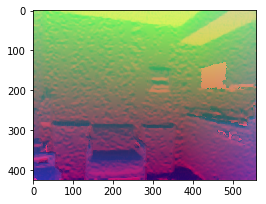

In [12]:
fig1,ax1 = plt.subplots(figsize=(4,4))
ax1.imshow(depth)
plt.show()

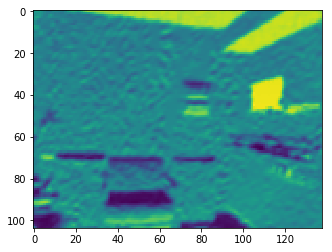

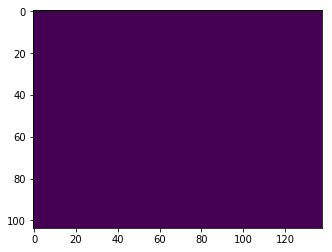

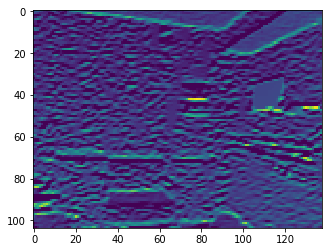

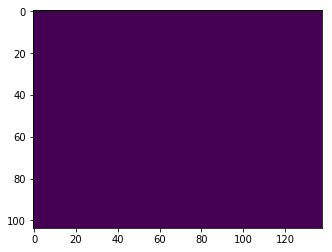

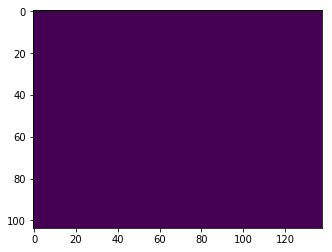

...

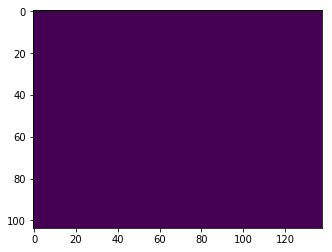

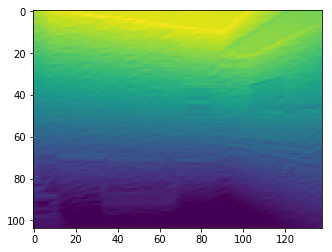

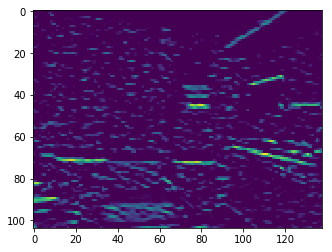

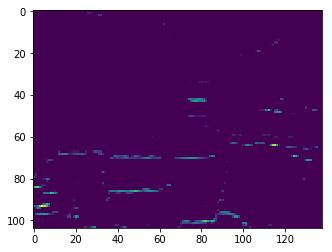

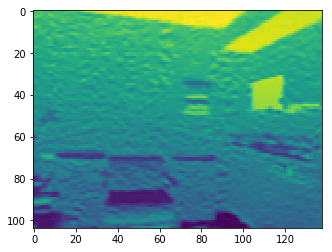

In [13]:
# Visualize Feature Map after First Convolution layer
image_arr=np.reshape(depth, (-1,depth.shape[0], depth.shape[1],3))
layer_1 = K.function([depth_model.layers[0].input], [depth_model.layers[1].output])
# 只修改inpu_image
f1 = layer_1([image_arr])[0]
# 第一层卷积后的特征图展示，输出是（1,54,54,96），（样本个数，特征图尺寸长，特征图尺寸宽，特征图个数）
re = np.transpose(f1, (0,3,1,2))
#print(len(re[0]))
for i in range(len(re[0])):
    #plt.subplot(48,2,i+1)
    plt.imshow(re[0][i]) #,cmap='gray'
    plt.savefig("d_conv1/"+str(i)+".png")
    plt.show()

256


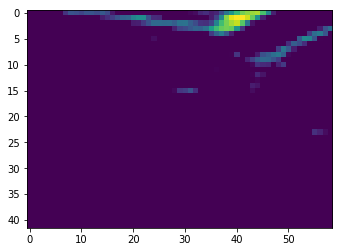

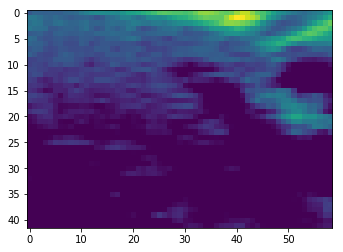

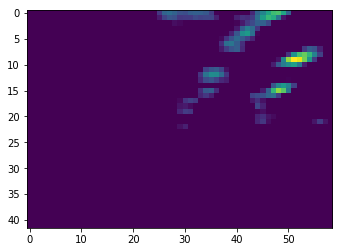

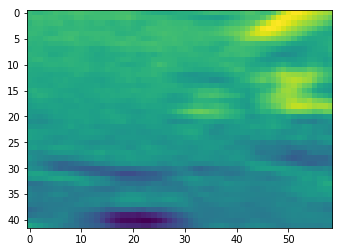

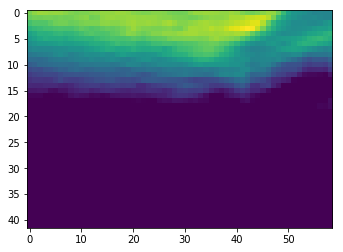

...

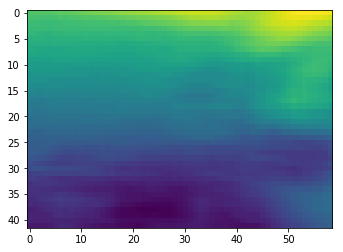

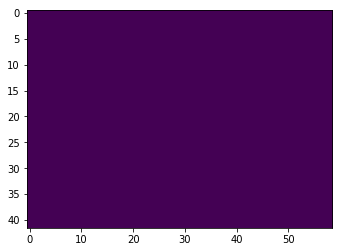

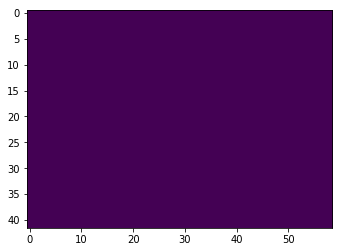

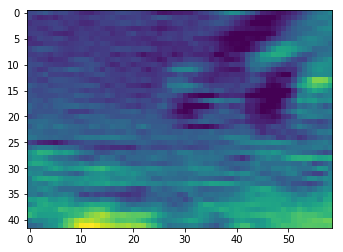

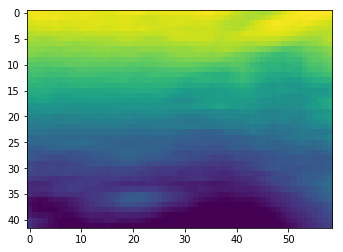

In [15]:
# Visualize Feature Map after Second Convolution layer
layer_2 = K.function([depth_model.layers[0].input], [depth_model.layers[4].output])
f2 = layer_2([image_arr])[0]
# 第一层卷积后的特征图展示，输出是（1,17,17,256），（样本个数，特征图尺寸长，特征图尺寸宽，特征图个数）
re = np.transpose(f2, (0,3,1,2))
print(len(re[0]))
for i in range(len(re[0])):
    plt.imshow(re[0][i]) #, cmap='gray'
    plt.savefig("d_conv2/"+str(i)+".png")
    plt.show()

384


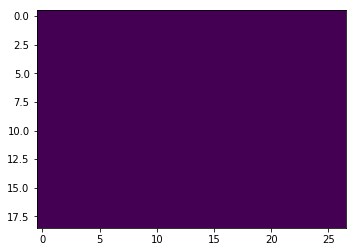

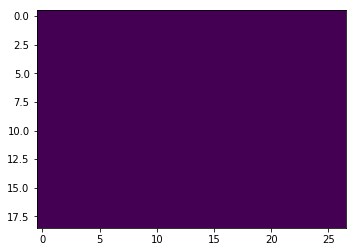

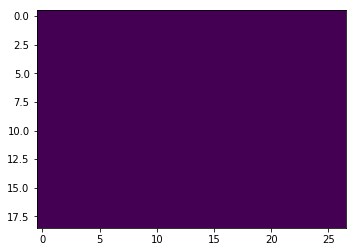

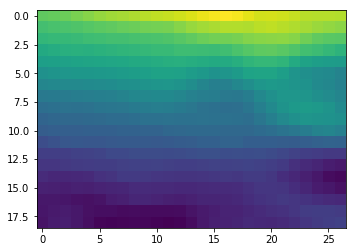

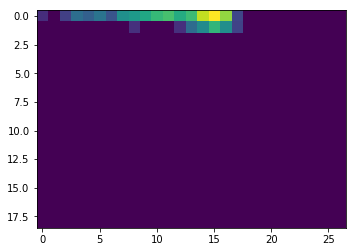

...

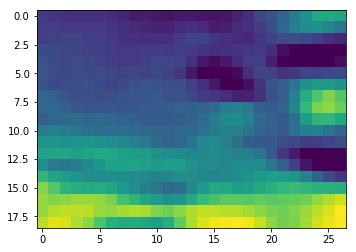

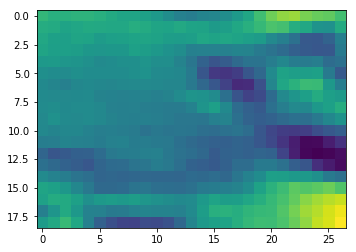

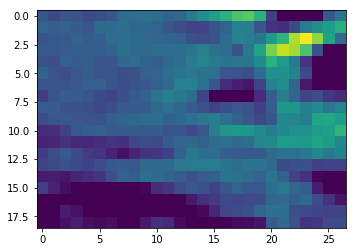

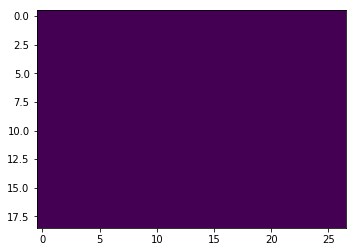

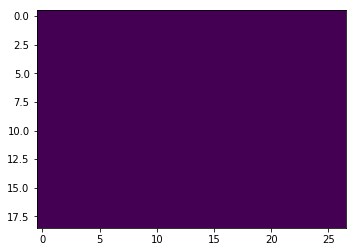

In [16]:
# Visualize Feature Map after Third Convolution layer
layer_3 = K.function([depth_model.layers[0].input], [depth_model.layers[7].output])
f3 = layer_3([image_arr])[0]
# 第一层卷积后的特征图展示，输出是（1,6,6,384），（样本个数，特征图尺寸长，特征图尺寸宽，特征图个数）
re = np.transpose(f3, (0,3,1,2))
print(len(re[0]))
for i in range(len(re[0])):
    #plt.subplot(48, 8,i+1)
    plt.imshow(re[0][i]) #, cmap='gray'
    plt.savefig("d_conv3/"+str(i)+".png")
    plt.show()

384


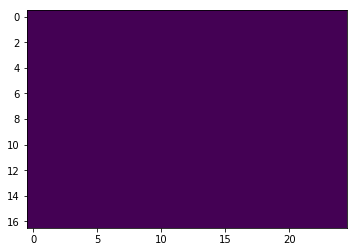

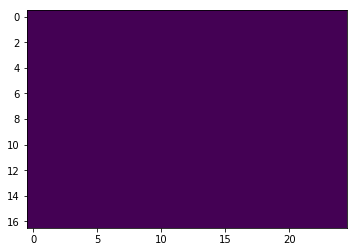

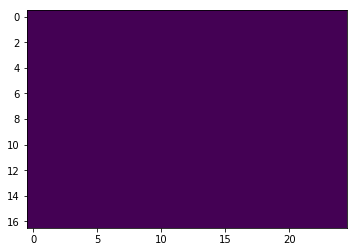

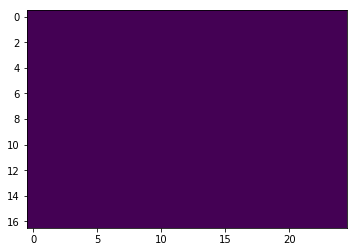

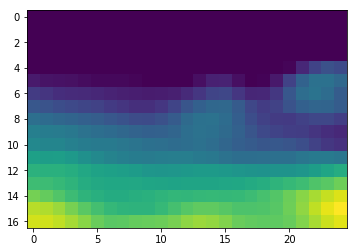

...

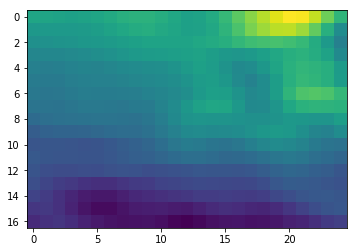

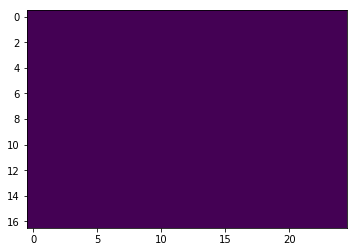

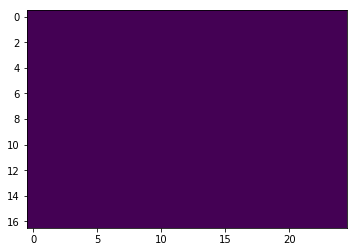

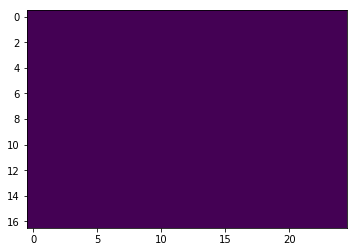

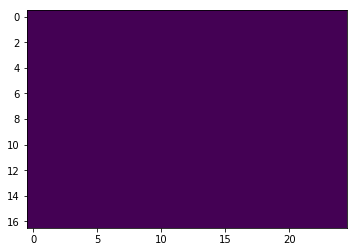

In [17]:
# Visualize Feature Maps after 4th Convolution layer
layer_4 = K.function([depth_model.layers[0].input], [depth_model.layers[9].output])
f4 = layer_4([image_arr])[0]
re = np.transpose(f4, (0,3,1,2))
print(len(re[0]))
for i in range(len(re[0])):
    #plt.subplot(48, 8,i+1)
    plt.imshow(re[0][i]) #, cmap='gray'
    plt.savefig("d_conv4/"+str(i)+".png")
    plt.show()

256


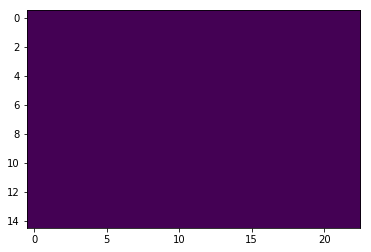

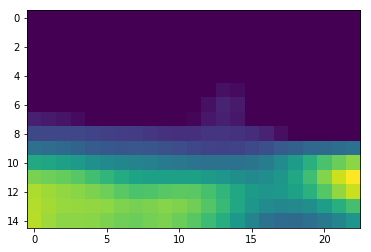

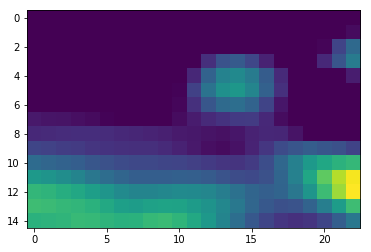

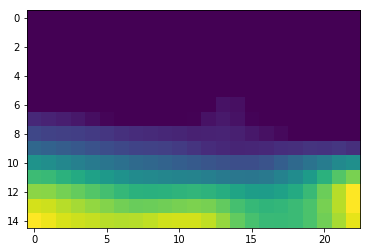

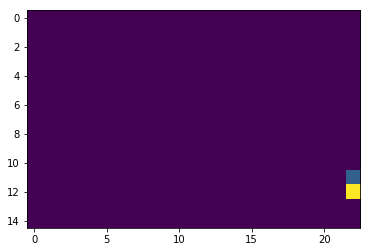

...

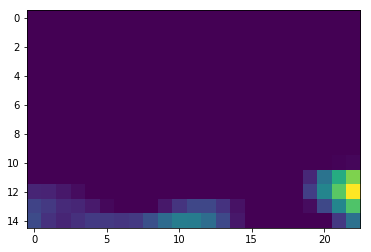

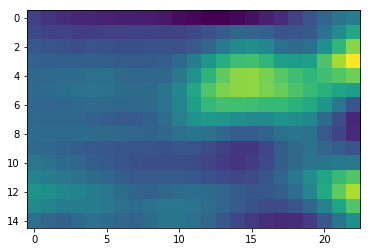

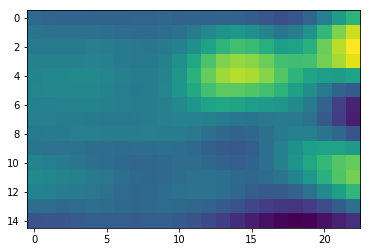

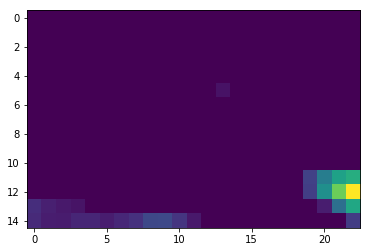

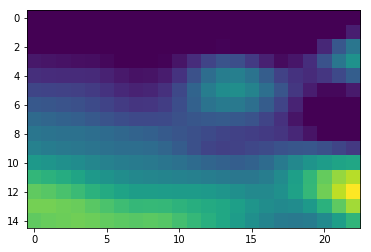

In [18]:
# Visualize Feature Maps after 5th Convolution layer
layer_5 = K.function([depth_model.layers[0].input], [depth_model.layers[11].output])
f5 = layer_5([image_arr])[0]
re = np.transpose(f5, (0,3,1,2))
print(len(re[0]))
for i in range(len(re[0])):
    #plt.subplot(48, 8,i+1)
    plt.imshow(re[0][i]) #, cmap='gray'
    plt.savefig("d_conv5/"+str(i)+".png")
    plt.show()

In [20]:
class VisualizeImageMaximizeFmap(object):
    def __init__(self,pic_shape):
        '''
        pic_shape : a dimention of a single picture e.g., (96,96,1)
        '''
        self.pic_shape = pic_shape
        
    def find_n_feature_map(self,layer_name,max_nfmap):
        '''
        shows the number of feature maps for this layer
        only works if the layer is CNN
        '''
        n_fmap = None
        for layer in depth_model.layers:
            if layer.name == layer_name:
                weights = layer.get_weights()
                n_fmap=weights[1].shape[0]
        if n_fmap is None:
            print(layer_name + " is not one of the layer names..")
            n_fmap = 1
        n_fmap = np.min([max_nfmap,n_fmap])
        return(int(n_fmap))

    def find_image_maximizing_activation(self,iterate,input_img_data,
                                         picorig=False,
                                         n_iter = 30):
        '''
        The input image is scaled to range between 0 and 1
        picorig  : True  if the picture image for input is original scale
                         ranging between 0 and 225
                   False if the picture image for input is ranging [0,1]
        '''
            
        input_img_data = np.random.random((1, 
                                           self.pic_shape[0],
                                           self.pic_shape[1],
                                           self.pic_shape[2]))
        if picorig:
            ## if the original picture is unscaled and ranging between (0,225),
            ## then the image values are centered around 123 with STD=25
            input_img_data = input_img_data*25 + 123 
        ## I played with this step value but the final image looks to be robust
        step = 500 

        
        
        # gradient ascent
        loss_values = []
        for i in range(n_iter):
            loss_value, grads_value = iterate([input_img_data, 0])
            input_img_data += grads_value * step
            loss_values.append(loss_value) 
        return(input_img_data,loss_values)

    def create_iterate(self,input_img, layer_output,filter_index):
        '''
        layer_output[:,:,:,0] is (Nsample, 94, 94) tensor contains:
        W0^T [f(image)]_{i,j}], i = 1,..., 94, j = 1,..., 94
        
        layer_output[:,:,:,1] contains:
        W1^T [f(image)]_{i,j}], i = 1,..., 94, j = 1,..., 94
        
        W0 and W1 are different kernel!
        '''
        ## loss is a scalar 
        if len(layer_output.shape) == 4:
            ## conv layer 
            loss = K.mean(layer_output[:,  :, :, filter_index])
        elif len(layer_output.shape) ==2:
            ## fully connected layer
            loss = K.mean(layer_output[:, filter_index])
         
        
        # calculate the gradient of the loss evaluated at the provided image
        grads = K.gradients(loss, input_img)[0]
        # normalize the gradients
        grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

        # iterate is a function taking (input_img, scalar) and output [loss_value, gradient_value]
        iterate = K.function([input_img, K.learning_phase()], [loss, grads])
        return(iterate)

    def deprocess_image(self,x):
        # standardize to have a mean 0 and std  0.1 
        x -= x.mean()
        x /= (x.std() + 1e-5)
        x *= 0.1

        # Shift x to have a mean 0.5 and std 0.1
        # This means 95% of the x should be in between 0 and 1
        # if x is normal
        x += 0.5
        x = np.clip(x, 0, 1)

        # resclar the values to range between 0 and 255
        x *= 255
        x = np.clip(x, 0, 255).astype('uint8')

        return x

    def find_images(self,input_img,layer_names,layer_dict, max_nfmap,
                    picorig=False,n_iter=30):
        '''
        Input :

        input_img   : the alias of the input layer from the deep learning model
        layer_names : list containing the name of the layers whose feature maps to be used
        layer_dict  : symbolic outputs of each "key" layer (we gave them unique names).
        max_nfmap   : the maximum number of feature map to be used for each layer.
        pic_shape   : For example pic_shape = (96,96,1)

        Output : 
        dictionary 

        key = layer name 
        value = a list containing the tuple of (images, list of loss_values) that maximize each feature map
        '''
        argimage = {}
        ## Look for the image for each feature map of each layer one by one
        for layer_name in layer_names: ## the layer to visualize
            n_fmap = self.find_n_feature_map(layer_name,max_nfmap)
            layer_output = layer_dict[layer_name].output
            result = self.find_images_for_layer(input_img,
                                                layer_output,
                                                range(n_fmap),
                                                picorig=picorig,
                                                n_iter=n_iter)

            argimage[layer_name] = result
        return(argimage)

    def find_images_for_layer(self,input_img,layer_output,indecies,
                              picorig=False,n_iter=30):
        '''
        indecies : list containing index of 
                      --> filtermaps of CNN or 
                      --> nodes of fully-connected layer
        Output

        a list containing the tuple of (images, list of loss_values) 
        that maximize each feature map


        '''
        result_temp = []
        for filter_index in indecies: # filtermap to visualize
                iterate = self.create_iterate(input_img, layer_output,filter_index)
                input_img_data, loss_values = self.find_image_maximizing_activation(
                    iterate,input_img,
                    picorig=picorig,
                    n_iter=n_iter)
                result_temp.append((input_img_data,loss_values))
        return(result_temp)

    def plot_images_wrapper(self,argimage,n_row = 8, scale = 1):
        '''
        scale : scale up or down the plot size
        '''
        pic_shape = self.pic_shape
        if pic_shape[2] == 1:
            pic_shape = self.pic_shape[:2]
        layer_names = argimage.keys() #np.sort(argimage.keys())


        for layer_name in layer_names:
            n_fmap = len(argimage[layer_name])
            n_col = np.ceil(n_fmap/float(n_row))
            fig = plt.figure(figsize=(n_col*scale,
                                      n_row*scale))
            fig.subplots_adjust(hspace=0.001,wspace=0.001)
            plt.title(layer_name + " n_featuremap=" + str(n_fmap))
            count = 1
            for value in argimage[layer_name]:
                input_img_data = value[0][0]
                img = self.deprocess_image(input_img_data)
                ax = fig.add_subplot(n_row,n_col,count,
                                    xticks=[],yticks=[])
                ax.imshow(img.reshape(*pic_shape),cmap="gray")
                count += 1
            plt.savefig(layer_name+".png")
            plt.show()

find images that maximize feature maps
dict_keys(['d_conv1'])
plot them...


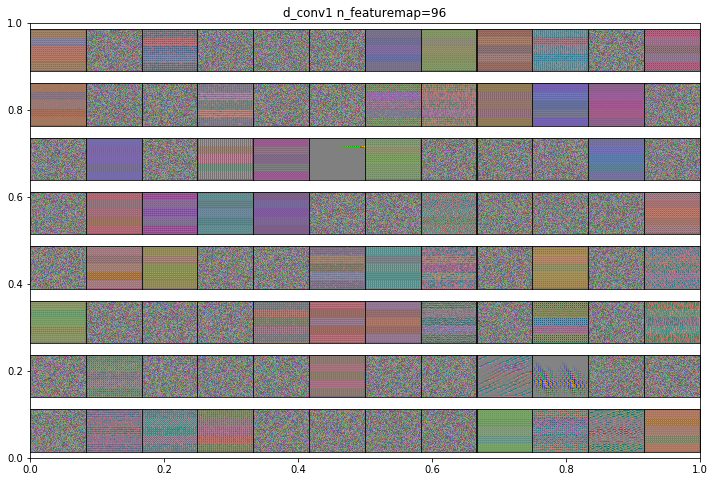

In [21]:
input_img = depth_model.layers[0].input
layer_names = ["d_conv1"]
layer_dict = dict([(layer.name, layer) for layer in depth_model.layers])
max_nfmap = np.Inf ## print ALL the images

visualizer = VisualizeImageMaximizeFmap(pic_shape = (425,560, 3))
print("find images that maximize feature maps")
argimage = visualizer.find_images(input_img,
                                  layer_names,
                                  layer_dict, 
                                  max_nfmap)
print(argimage.keys())
print("plot them...")
visualizer.plot_images_wrapper(argimage,n_row = 8, scale = 1)

find images that maximize feature maps
dict_keys(['d_conv2'])
plot them...


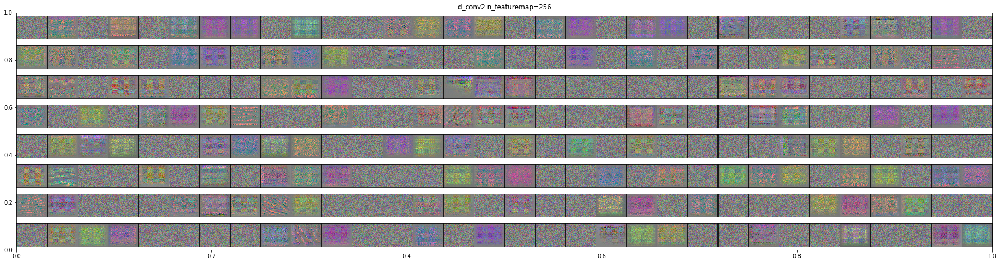

In [22]:
input_img = depth_model.layers[0].input
layer_names = ["d_conv2"]
layer_dict = dict([(layer.name, layer) for layer in depth_model.layers])
max_nfmap = np.Inf ## print ALL the images

visualizer = VisualizeImageMaximizeFmap(pic_shape = (425,560,3))
print("find images that maximize feature maps")
argimage = visualizer.find_images(input_img,
                                  layer_names,
                                  layer_dict, 
                                  max_nfmap)
print(argimage.keys())
print("plot them...")
visualizer.plot_images_wrapper(argimage,n_row = 8, scale = 1)